# Recurrent Neural Networks for Stock Price Prediction

* RNN
* LSTM
* GRU

In [1]:
# Import libraries.
import kagglehub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pandas_market_calendars as mcal
import random
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset

In [2]:
seed = 42
np.random.seed(seed)

# Set seed for PyTorch.
torch.manual_seed(seed)

# Set seed for inbuilt random function.
random.seed(seed)

# Use Metal GPU.
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# Increase DPI for plots.
plt.rcParams['figure.dpi'] = 500

In [9]:
# Download and load the dataset
base_path = kagglehub.dataset_download("paultimothymooney/stock-market-data")
path = f"{base_path}/stock_market_data/nasdaq/csv/ADBE.csv"
df_ = pd.read_csv(path).drop(['Adjusted Close'], axis=1)
df = df_.iloc[:int(0.8 * df_.shape[0])]
df_test = df_.iloc[int(0.8 * df_.shape[0]):]

In [12]:
df

,Date,Low,Open,Volume,High,Close
0,13-08-1986,0.210938,0.000000,18899200,0.218750,0.210938
1,14-08-1986,0.222656,0.000000,4160000,0.230469,0.222656
2,15-08-1986,0.218750,0.000000,4332800,0.222656,0.218750
3,18-08-1986,0.210938,0.000000,2828800,0.218750,0.210938
4,19-08-1986,0.214844,0.000000,2060800,0.218750,0.214844
...,...,...,...,...,...,...
7321,27-08-2015,77.389999,78.410004,5197200,79.279999,78.910004
7322,28-08-2015,77.750000,78.419998,3316400,79.449997,79.400002
7323,31-08-2015,78.300003,79.379997,2313100,79.699997,78.570000
7324,01-09-2015,75.629997,77.070000,3206400,77.820000,75.989998


## Exploratory Data Analysis & Data Pre-processing

In [14]:
# Convert date to month/date/year format.
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
df_test['Date'] = pd.to_datetime(df_test['Date'], format='%d-%m-%Y')
df.head(n=15)

/var/folders/t9/jy4gpb6x1tqb_1xyjtwf6jv40000gn/T/ipykernel_32267/462656788.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
/var/folders/t9/jy4gpb6x1tqb_1xyjtwf6jv40000gn/T/ipykernel_32267/462656788.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['Date'] = pd.to_datetime(df_test['Date'], format='%d-%m-%Y')


,Date,Low,Open,Volume,High,Close
0,1986-08-13,0.210938,0.0,18899200,0.218750,0.210938
1,1986-08-14,0.222656,0.0,4160000,0.230469,0.222656
2,1986-08-15,0.218750,0.0,4332800,0.222656,0.218750
3,1986-08-18,0.210938,0.0,2828800,0.218750,0.210938
4,1986-08-19,0.214844,0.0,2060800,0.218750,0.214844
5,1986-08-20,0.214844,0.0,684800,0.226563,0.214844
6,1986-08-21,0.222656,0.0,883200,0.234375,0.222656
7,1986-08-22,0.222656,0.0,1734400,0.230469,0.222656
8,1986-08-25,0.214844,0.0,627200,0.222656,0.214844
9,1986-08-26,0.214844,0.0,793600,0.222656,0.214844


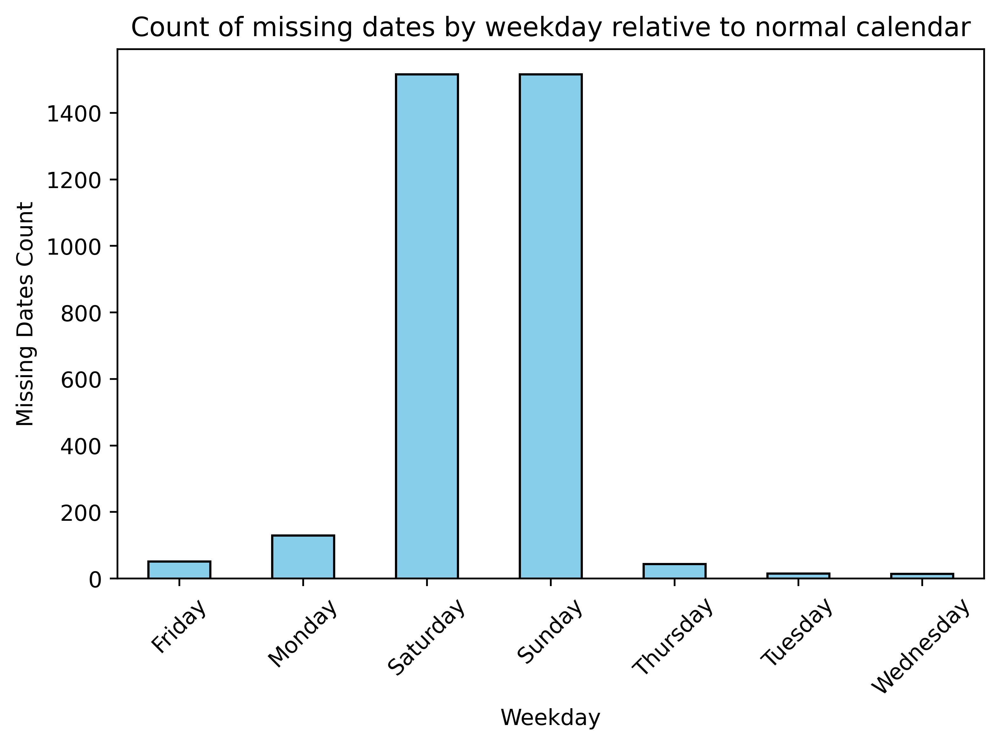

In [15]:
# Count the missing dates
full_date_range = pd.date_range(start=df['Date'].min(), end=df['Date'].max())
missing_dates = full_date_range.difference(df['Date'])
missing_dates_df = pd.DataFrame({'Date': missing_dates})
missing_dates_df['Weekday'] = missing_dates_df['Date'].dt.day_name()

# Count missing dates by weekday
weekday_counts = missing_dates_df['Weekday'].value_counts()

# Plot the counts in a bar chart
weekday_counts.sort_index(inplace=True)  # Sort by weekday order
weekday_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Count of missing dates by weekday relative to normal calendar')
plt.xlabel('Weekday')
plt.ylabel('Missing Dates Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [16]:
# Count the missing dates relative to the financial calendar.
nyse = mcal.get_calendar('NYSE')
schedule = nyse.schedule(start_date=df['Date'].min(), end_date=df['Date'].max())

# Generate a list of valid market days
valid_market_days = schedule.index

# Identify missing market days
missing_market_days = valid_market_days.difference(df['Date'])

# Convert to DataFrame for analysis
missing_days_df = pd.DataFrame({'Missing Dates': missing_market_days})
missing_days_df['Weekday'] = missing_days_df['Missing Dates'].dt.day_name()

# Output
print("Missing Market Days:")
print(missing_days_df)

Missing Market Days:
Empty DataFrame
Columns: [Missing Dates, Weekday]
Index: []


### Implication of missing dates
- When comparing the continuity of dates with the normal calendar, some dates are missing. However, it matches with the financial calendar.
- Some dates are missing since the financial market is closed on weekends and public holidays.
- These dates can be backfilled with data from previous dates.
- While predicting, additional checks are essential to account for market holidays.

In [17]:
# Backfill missing dates data.
# Set 'Date' as index
df.set_index('Date', inplace=True)

# Generate the complete date range
full_date_range = pd.date_range(start=df.index.min(), end=df.index.max())

# Reindex the DataFrame to include all dates
df = df.reindex(full_date_range)

# Backfill missing rows with the previous day's data
df = df.bfill()

# Reset the index and rename columns
df.reset_index(inplace=True)
df.rename(columns={'index': 'Date'}, inplace=True)


In [18]:
df_test.set_index('Date', inplace=True)

# Generate the complete date range
full_date_range = pd.date_range(start=df_test.index.min(), end=df_test.index.max())

# Reindex the DataFrame to include all dates
df_test = df_test.reindex(full_date_range)

# Backfill missing rows with the previous day's data
df_test = df_test.bfill()

# Reset the index and rename columns
df_test.reset_index(inplace=True)
df_test.rename(columns={'index': 'Date'}, inplace=True)

In [19]:
df.head(n=15)

,Date,Low,Open,Volume,High,Close
0,1986-08-13,0.210938,0.0,18899200.0,0.218750,0.210938
1,1986-08-14,0.222656,0.0,4160000.0,0.230469,0.222656
2,1986-08-15,0.218750,0.0,4332800.0,0.222656,0.218750
3,1986-08-16,0.210938,0.0,2828800.0,0.218750,0.210938
4,1986-08-17,0.210938,0.0,2828800.0,0.218750,0.210938
5,1986-08-18,0.210938,0.0,2828800.0,0.218750,0.210938
6,1986-08-19,0.214844,0.0,2060800.0,0.218750,0.214844
7,1986-08-20,0.214844,0.0,684800.0,0.226563,0.214844
8,1986-08-21,0.222656,0.0,883200.0,0.234375,0.222656
9,1986-08-22,0.222656,0.0,1734400.0,0.230469,0.222656


In [20]:
df.dtypes

Date      datetime64[ns]
Low              float64
Open             float64
Volume           float64
High             float64
Close            float64
dtype: object

In [21]:
df_test.dtypes

Date      datetime64[ns]
Low              float64
Open             float64
Volume           float64
High             float64
Close            float64
dtype: object

### Data type inference
- Need to convert Close and Volume columns to float data type for computation.

In [12]:
# df['Close'] = df['Close'].apply(lambda x : x.replace(',', '')).astype('float')
# df['Volume'] = df['Volume'].apply(lambda x : x.replace(',', '')).astype('float')
# df_test['Volume'] = df_test['Volume'].apply(lambda x : x.replace(',', '')).astype('float')

In [13]:
# df.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume           float64
dtype: object

In [14]:
# df_test.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume           float64
dtype: object

### Data visualisation

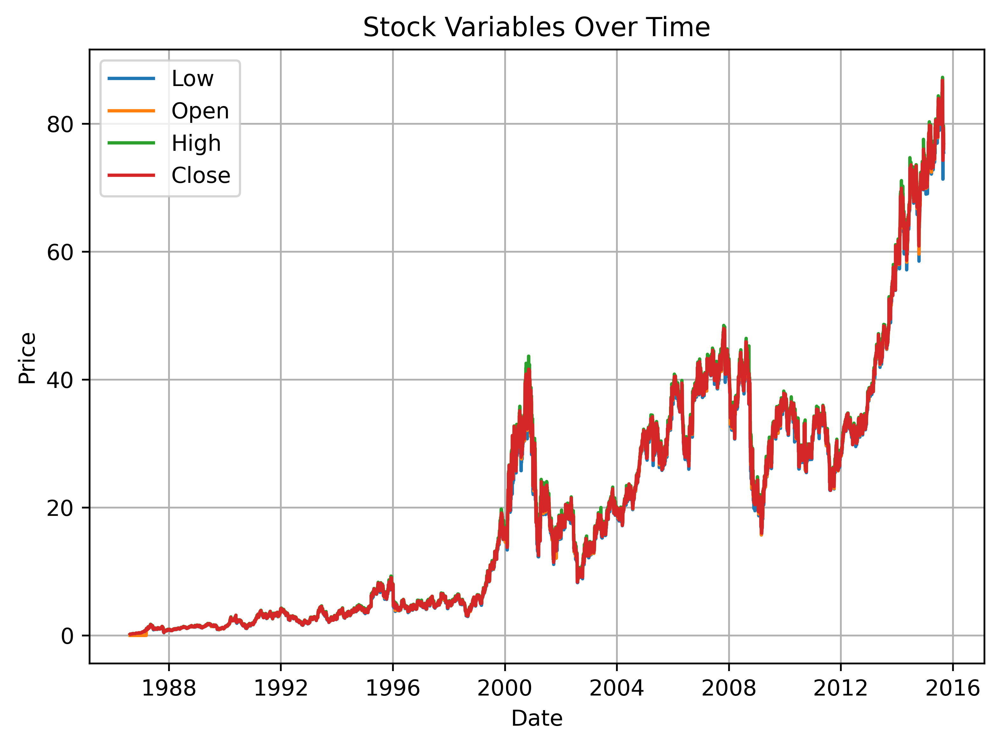

In [22]:
for column in df.drop(['Date', 'Volume'], axis=1).columns:
    plt.plot(df['Date'], df[column], label=column)

# Customize the plot
plt.title('Stock Variables Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='upper left')
plt.grid()
plt.tight_layout()

plt.show()

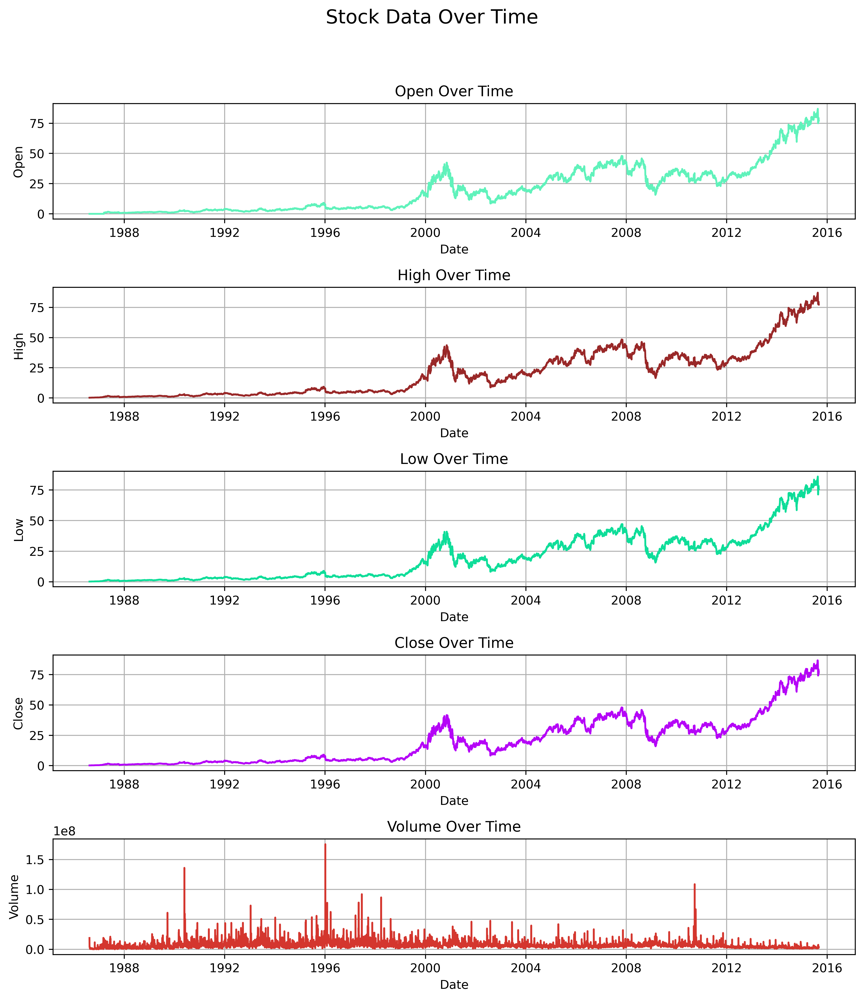

In [23]:
# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 12), sharex=False)

# Plot each variable
variables = ['Open', 'High', 'Low', 'Close', 'Volume']
for i, var in enumerate(variables):
    axes[i].plot(df['Date'], df[var], label=var, color=np.random.rand(3,))
    axes[i].set_title(f'{var} Over Time')
    axes[i].set_ylabel(var)
    axes[i].grid(True)
    axes[i].set_xlabel('Date')

# Set common labels
fig.suptitle('Stock Data Over Time', fontsize=16)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

- Open, High, and Low variables have a similar pattern
- The pattern of the Close variable deviates around the year 2014.
- Volume variable has a fluctuating pattern.

### Data distribution

In [24]:
df.describe()

,Date,Low,Open,Volume,High,Close
count,10613,10613.000000,10613.000000,1.061300e+04,10613.000000,10613.000000
mean,2001-02-21 00:00:00,19.862072,20.159848,7.114768e+06,20.470316,20.172995
min,1986-08-13 00:00:00,0.207031,0.000000,4.480000e+04,0.218750,0.207031
25%,1993-11-17 00:00:00,3.406250,3.468750,3.809300e+06,3.546875,3.484375
50%,2001-02-21 00:00:00,15.880000,16.250000,5.780400e+06,16.700001,16.187500
75%,2008-05-28 00:00:00,32.200001,32.599998,8.620800e+06,33.000000,32.619999
max,2015-09-02 00:00:00,86.029999,86.980003,1.755136e+08,87.250000,86.769997
std,NaN,19.099103,19.304190,6.146042e+06,19.485227,19.298990


- The data need to be normalised for uniformity across all variables.
- The date variable cannot be used as is. It can be transformed to timestamp.

In [25]:
df['Timestamp'] = df['Date'].astype('int64') // 10**9
df_test['Timestamp'] = df_test['Date'].astype('int64') // 10**9

In [26]:
# Scale the data using the standard scalar.
scaled_columns = [x for x in df.columns if x != 'Date']
scaler = StandardScaler()
df[scaled_columns] = scaler.fit_transform(df[scaled_columns])
df_test[scaled_columns] = scaler.transform(df_test[scaled_columns])

In [27]:
df.describe()

,Date,Low,Open,Volume,High,Close,Timestamp
count,10613,10613.000000,10613.000000,1.061300e+04,1.061300e+04,1.061300e+04,10613.000000
mean,2001-02-21 00:00:00,0.000000,0.000000,1.071204e-17,1.285444e-16,-4.284814e-17,0.000000
min,1986-08-13 00:00:00,-1.029157,-1.044374,-1.150383e+00,-1.039378e+00,-1.034609e+00,-1.731888
25%,1993-11-17 00:00:00,-0.861642,-0.864677,-5.378460e-01,-8.685677e-01,-8.647814e-01,-0.865944
50%,2001-02-21 00:00:00,-0.208505,-0.202548,-2.171204e-01,-1.935052e-01,-2.065229e-01,0.000000
75%,2008-05-28 00:00:00,0.646026,0.644458,2.450525e-01,6.430653e-01,6.449866e-01,0.865944
max,2015-09-02 00:00:00,3.464615,3.461596,2.740085e+01,3.427357e+00,3.450965e+00,1.731888
std,NaN,1.000047,1.000047,1.000047e+00,1.000047e+00,1.000047e+00,1.000047


In [28]:
df_test.describe()

,Date,Low,Open,Volume,High,Close,Timestamp
count,2658,2658.000000,2658.000000,2658.000000,2658.000000,2658.000000,2658.000000
mean,2019-04-23 12:00:00,14.143064,14.178080,-0.692683,14.211245,14.179929,2.165839
min,2015-09-03 00:00:00,2.691768,2.791243,-1.061801,2.825847,2.781469,1.732214
25%,2017-06-28 06:00:00,6.391330,6.373406,-0.848544,6.338546,6.382345,1.949026
50%,2019-04-23 12:00:00,13.007660,12.997799,-0.748764,12.956307,13.015647,2.165839
75%,2021-02-15 18:00:00,21.142457,21.266212,-0.599588,21.436079,21.220349,2.382651
max,2022-12-12 00:00:00,34.508372,35.026181,3.372318,34.852130,34.625050,2.599463
std,NaN,8.372354,8.406244,0.255084,8.431310,8.401114,0.250495


### Convert data to sequence

In [29]:
# Function to create sequences.
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        seq = data.iloc[i:i+seq_length]
        target = data.iloc[i+seq_length] 
        sequences.append((seq, target))
    return sequences

seq_length = 30  # No of previous days considered.
train_sequences = create_sequences(df.drop(['Date'], axis=1), seq_length)

## Modeling

In [30]:
class StockDataset(Dataset):
    """
    Custom dataset loader class.
    """
    def __init__(self, sequences):
        self.sequences = sequences

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        seq, label = self.sequences[idx]
        return torch.tensor(seq.to_numpy(), dtype=torch.float32), torch.tensor(label, dtype=torch.float32)


In [31]:
# Model definitions.
class StockRNN(nn.Module):
    """
    RNN model.
    """
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(StockRNN, self).__init__()
        self.rnn = nn.RNN(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc_list = nn.ModuleList()
        current_dim = hidden_dim
        # Add dense layers by dividing the hidden dimensions continuously by 2.
        while current_dim // 2 > output_dim:
            self.fc_list.append(nn.Linear(current_dim, current_dim // 2))
            current_dim //= 2
        self.fc_list.append(nn.Linear(current_dim, output_dim))
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.01)
        
    def forward(self, x):
        out, _ = self.rnn(x)
        out = out[:, -1, :]
        for linear in self.fc_list:
            out = self.leaky_relu(linear(out))
        return out
        
    def __str__(self):
        return "RNN"

class StockLSTM(nn.Module):
    """
    LSTM model.
    """
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(StockLSTM, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc_list = nn.ModuleList()
        current_dim = hidden_dim
        # Add dense layers by dividing the hidden dimensions continuously by 2.
        while current_dim // 2 > output_dim:
            self.fc_list.append(nn.Linear(current_dim, current_dim // 2))
            current_dim //= 2
        self.fc_list.append(nn.Linear(current_dim, output_dim))
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.01)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        for linear in self.fc_list:
            out = self.leaky_relu(linear(out))
        return out
        
    def __str__(self):
        return "LSTM"

class StockGRU(nn.Module):
    """
    GRU model.
    """
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(StockGRU, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc_list = nn.ModuleList()
        current_dim = hidden_dim
        # Add dense layers by dividing the hidden dimensions continuously by 2.
        while current_dim // 2 > output_dim:
            self.fc_list.append(nn.Linear(current_dim, current_dim // 2))
            current_dim //= 2
        self.fc_list.append(nn.Linear(current_dim, output_dim))
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.01)

    def forward(self, x):
        out, _ = self.gru(x)
        out = out[:, -1, :]
        for linear in self.fc_list:
            out = self.leaky_relu(linear(out))
        return out

    def __str__(self):
        return "GRU"


In [32]:
# Constants
fold = 5
early_stopping_patience = 5
max_epochs = 500
batch_size = 32
input_units = output_units = 6
loss_scale = 1

In [33]:
def square_matrix(matrix):
    """
    Convert sparse matrix to dense matrix.
    """
    max_length = max(len(row) for row in matrix)
    
    # Pad each row by duplicating the last element until it matches max_length
    for row in matrix:
        row.extend([row[-1]] * (max_length - len(row)))
    
    return matrix

In [34]:
# Kfold cross validation.
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Hyperparameters
hyperparams = {
    'hidden_dim': [32, 64], 
    'num_layers': [1, 2], 
    'learning_rate': [0.001, 0.0001]
}


def tune_and_train(model_class, hyperparams):
    """
    Function for hyperparameter tuning and training of the provided model.
    """
    best_rmse = float('inf')
    best_model = None
    best_params = {}
    best_loss_curves = {'train': None, 'validation': None}
    for hidden_dim in hyperparams['hidden_dim']:
        for num_layers in hyperparams['num_layers']:
            for learning_rate in hyperparams['learning_rate']:
                print(f"Using hyperparameters: #Hidden: {hidden_dim}, #Layers: {num_layers}, Lr: {learning_rate}")
                fold_rmse = []
                fold_count = 1
                per_fold_loss_curve = []
                per_fold_val_loss_curve = []
                best_model_per_fold = None
                best_rmse_per_fold = float('inf')
                # Train for each fold.
                for train_idx, val_idx in kf.split(train_sequences):
                    print(f"Fold #{fold_count}")

                    train_fold = [train_sequences[i] for i in train_idx]
                    val_fold = [train_sequences[i] for i in val_idx]
    
                    train_loader = DataLoader(StockDataset(train_fold), batch_size=batch_size, shuffle=True)
                    val_loader = DataLoader(StockDataset(val_fold), batch_size=batch_size)
    
                    # Model, Loss, Optimizer
                    model = model_class(input_dim=input_units, hidden_dim=hidden_dim, num_layers=num_layers, output_dim=output_units)
                    criterion = nn.MSELoss()
                    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    
                    # Training
                    best_val_loss = float('inf')
                    patience_counter = 0
                    train_loss = []
                    val_loss_ = []
                    for epoch in range(max_epochs):  # Max epochs
                        model.train()
                        total_batch_loss = []
                        for x_batch, y_batch in train_loader:
                            optimizer.zero_grad()
                            y_pred = model(x_batch)
                            loss = criterion(y_pred, y_batch) * loss_scale
                            total_batch_loss.append(loss.item())
                            loss.backward()
                            optimizer.step()
                        train_loss.append(np.mean(total_batch_loss))
    
                        # Validation
                        model.eval()
                        val_loss = 0
                        with torch.no_grad():
                            for x_batch, y_batch in val_loader:
                                y_pred = model(x_batch)
                                val_loss += criterion(y_pred, y_batch).item() * loss_scale
                        val_loss /= len(val_loader)
                        val_loss_.append(val_loss)
                        print(f"[{epoch}/{max_epochs}] loss: {train_loss[-1]: .6f} val_loss: {val_loss: .6f}")
                        
                        # Early stopping.
                        if val_loss < best_val_loss:
                            best_val_loss = val_loss
                            patience_counter = 0
                        else:
                            patience_counter += 1
                            if patience_counter >= early_stopping_patience:
                                break
                    # Training and validation loss per epoch and per fold.
                    per_fold_loss_curve.append(train_loss)
                    per_fold_val_loss_curve.append(val_loss_)
                    
                    fold_count += 1
                    fold_rmse.append(np.sqrt(best_val_loss/loss_scale))
                    
                    # Save the best model among folds.
                    if fold_rmse[-1] < best_rmse_per_fold:
                        best_rmse_per_fold = fold_rmse[-1]
                        best_model_per_fold = model
                avg_rmse = np.mean(fold_rmse)
                
                # Save the best model and hyperparameter.
                if avg_rmse < best_rmse:
                    best_rmse = avg_rmse
                    best_model = best_model_per_fold
                    best_params = {'hidden_dim': hidden_dim, 'num_layers': num_layers, 'learning_rate': learning_rate}
                    best_loss_curves['train'] = np.mean(square_matrix(per_fold_loss_curve), axis=0)
                    best_loss_curves['validation'] = np.mean(square_matrix(per_fold_val_loss_curve), axis=0)
    return best_model, best_params, best_rmse, best_loss_curves


In [35]:
models = [StockRNN, StockLSTM, StockGRU]
tuned_results_per_model = {}
for model_class in models:
    print(f"Training: {model_class}")
    best_model, best_params, rmse, curves = tune_and_train(model_class, hyperparams)
    tuned_results_per_model[str(best_model)] = {
        'model': best_model,
        'params': best_params,
        'rmse': rmse,
        'curves': curves
    }

Training: <class '__main__.StockRNN'>
Using hyperparameters: #Hidden: 32, #Layers: 1, Lr: 0.001
Fold #1


/var/folders/t9/jy4gpb6x1tqb_1xyjtwf6jv40000gn/T/ipykernel_32267/2571512835.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return torch.tensor(seq.to_numpy(), dtype=torch.float32), torch.tensor(label, dtype=torch.float32)


[0/500] loss:  0.661935 val_loss:  0.486656
[1/500] loss:  0.296234 val_loss:  0.217334
[2/500] loss:  0.188380 val_loss:  0.204858
[3/500] loss:  0.185410 val_loss:  0.205020
[4/500] loss:  0.181737 val_loss:  0.199903
[5/500] loss:  0.177803 val_loss:  0.196009
[6/500] loss:  0.172123 val_loss:  0.189883
[7/500] loss:  0.168362 val_loss:  0.187608
[8/500] loss:  0.167129 val_loss:  0.186740
[9/500] loss:  0.166033 val_loss:  0.186329
[10/500] loss:  0.165429 val_loss:  0.185431
[11/500] loss:  0.163979 val_loss:  0.184429
[12/500] loss:  0.163961 val_loss:  0.177346
[13/500] loss:  0.148308 val_loss:  0.162013
[14/500] loss:  0.133121 val_loss:  0.146866
[15/500] loss:  0.126615 val_loss:  0.147103
[16/500] loss:  0.127265 val_loss:  0.147696
[17/500] loss:  0.124568 val_loss:  0.149805
[18/500] loss:  0.123811 val_loss:  0.144005
[19/500] loss:  0.121385 val_loss:  0.143173
[20/500] loss:  0.120142 val_loss:  0.142705
[21/500] loss:  0.119381 val_loss:  0.144361
[22/500] loss:  0.11

In [36]:
tuned_results_per_model

{'RNN': {'model': StockRNN(
    (rnn): RNN(6, 64, num_layers=2, batch_first=True)
    (fc_list): ModuleList(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): Linear(in_features=32, out_features=16, bias=True)
      (2): Linear(in_features=16, out_features=8, bias=True)
      (3): Linear(in_features=8, out_features=6, bias=True)
    )
    (leaky_relu): LeakyReLU(negative_slope=0.01)
  ),
  'params': {'hidden_dim': 64, 'num_layers': 2, 'learning_rate': 0.001},
  'rmse': 0.3371919917685006,
  'curves': {'train': array([0.62424117, 0.35631731, 0.25695908, 0.18909488, 0.15581797,
          0.15335006, 0.15269572, 0.15124965, 0.15089664, 0.1484531 ,
          0.14815619, 0.15078052, 0.13773652, 0.13255642, 0.13207194,
          0.13142012, 0.12897967, 0.12681802, 0.12676075, 0.12625454,
          0.12430172, 0.12384839, 0.1240152 , 0.12235743, 0.11948497,
          0.11975699, 0.11742791, 0.1173942 , 0.1171308 , 0.11800929,
          0.11577866, 0.11562656, 0.11573954

## Testing

- Perform testing on Test data.

In [37]:
test_sequences = create_sequences(df_test.drop(['Date'], axis=1), seq_length)
test_loader = DataLoader(StockDataset(test_sequences), batch_size=batch_size)

for k, res in tuned_results_per_model.items():
    model = res['model']
    predictions = []
    actuals = []
    
    model.eval()
    with torch.no_grad():
        for x_batch, y_batch in test_loader:
            y_pred = model(x_batch)
            predictions.extend(y_pred.numpy())
            actuals.extend(y_batch.numpy())
    rmse = np.sqrt(mean_squared_error(actuals, predictions))
    tuned_results_per_model[k]['test_rmse'] = rmse
tuned_results_per_model


/var/folders/t9/jy4gpb6x1tqb_1xyjtwf6jv40000gn/T/ipykernel_32267/2571512835.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return torch.tensor(seq.to_numpy(), dtype=torch.float32), torch.tensor(label, dtype=torch.float32)
/var/folders/t9/jy4gpb6x1tqb_1xyjtwf6jv40000gn/T/ipykernel_32267/2571512835.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return torch.tensor(seq.to_numpy(), dtype=torch.float32), torch.tensor(label, dtype=torch.float32)
/var/folders/t9/jy4gpb6x1tqb_1xyjtwf6jv40000gn/T/ipykernel_32267/2571512835.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

{'RNN': {'model': StockRNN(
    (rnn): RNN(6, 64, num_layers=2, batch_first=True)
    (fc_list): ModuleList(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): Linear(in_features=32, out_features=16, bias=True)
      (2): Linear(in_features=16, out_features=8, bias=True)
      (3): Linear(in_features=8, out_features=6, bias=True)
    )
    (leaky_relu): LeakyReLU(negative_slope=0.01)
  ),
  'params': {'hidden_dim': 64, 'num_layers': 2, 'learning_rate': 0.001},
  'rmse': 0.3371919917685006,
  'curves': {'train': array([0.62424117, 0.35631731, 0.25695908, 0.18909488, 0.15581797,
          0.15335006, 0.15269572, 0.15124965, 0.15089664, 0.1484531 ,
          0.14815619, 0.15078052, 0.13773652, 0.13255642, 0.13207194,
          0.13142012, 0.12897967, 0.12681802, 0.12676075, 0.12625454,
          0.12430172, 0.12384839, 0.1240152 , 0.12235743, 0.11948497,
          0.11975699, 0.11742791, 0.1173942 , 0.1171308 , 0.11800929,
          0.11577866, 0.11562656, 0.11573954

## Evaluation

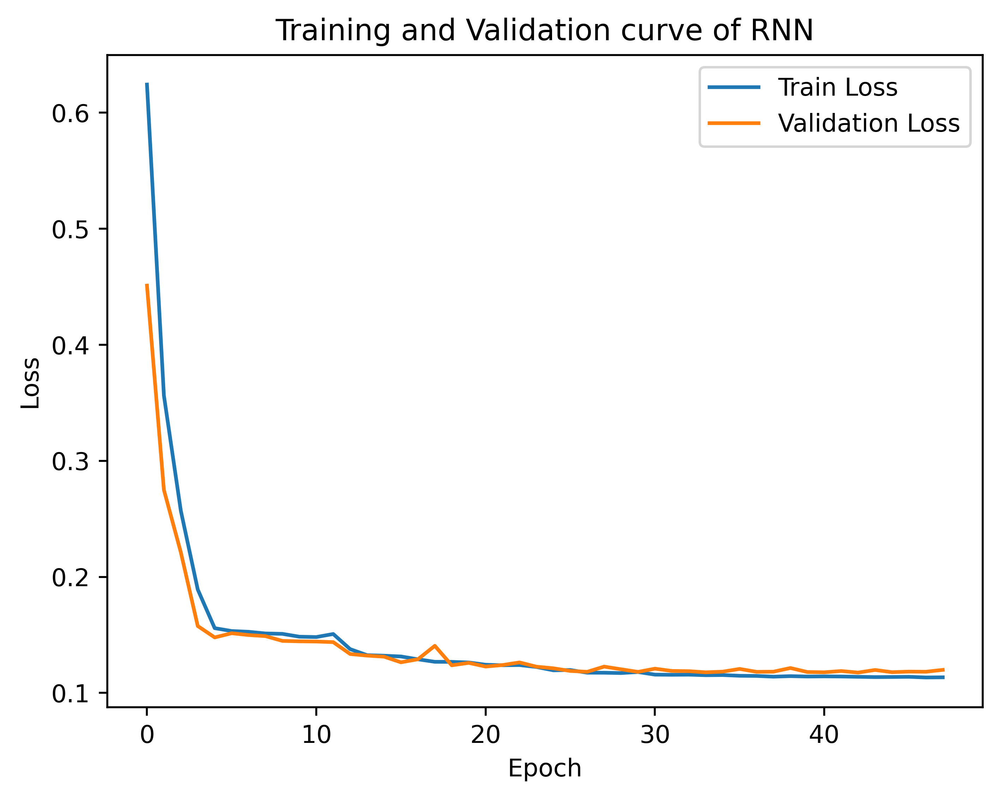

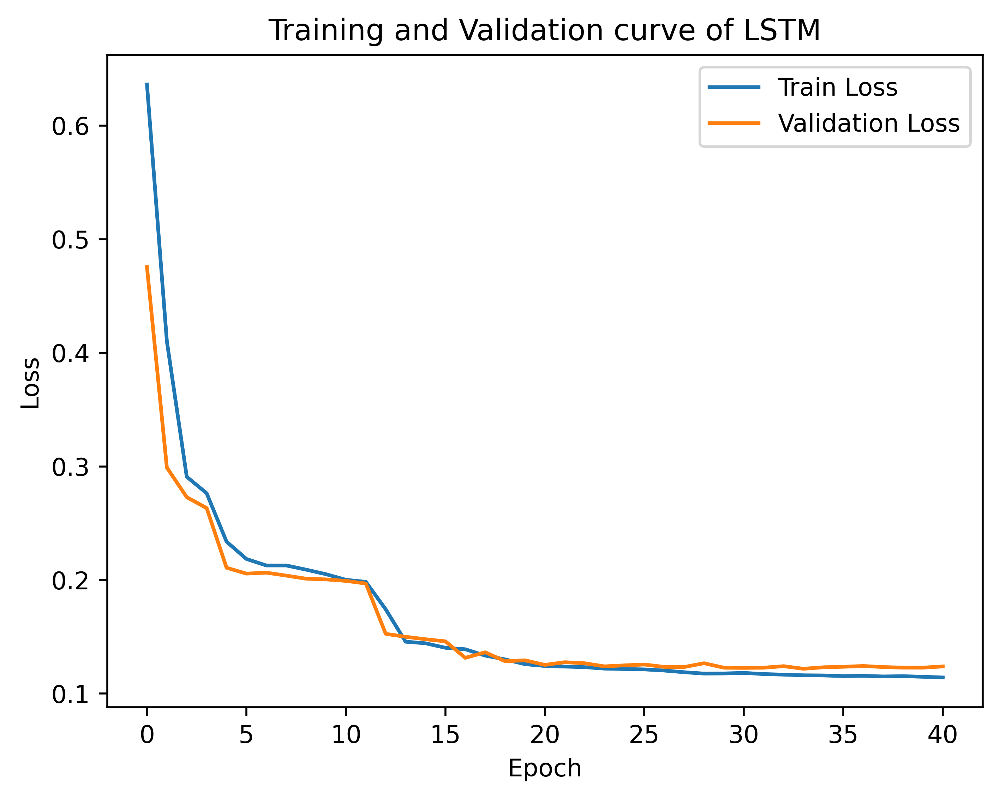

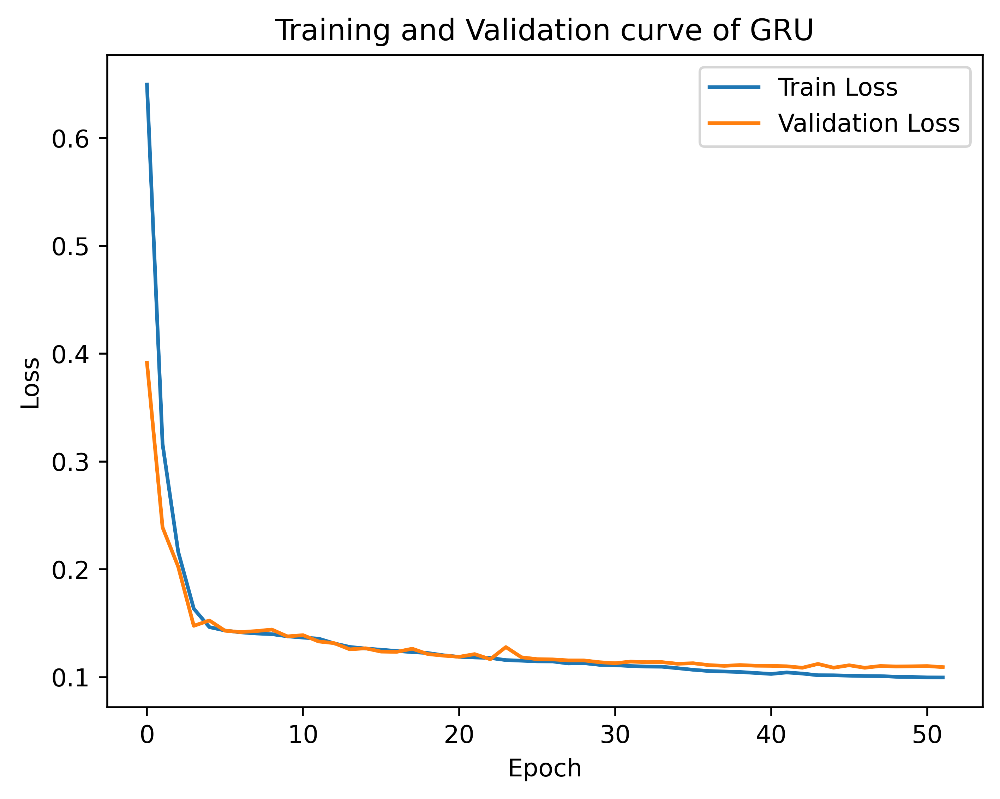

In [38]:
# Plot train and validation loss curves
for k, res in tuned_results_per_model.items():
    epochs = len(res['curves']['train'])
    plt.plot(list(range(epochs)), res['curves']['train'], label='Train Loss')
    plt.plot(list(range(epochs)), res['curves']['validation'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f"Training and Validation curve of {res['model']}")
    plt.legend()
    plt.show()

In [39]:
# Display the scores in DataFrame
res_data = []
for k, res in tuned_results_per_model.items():
    res_data.append({
        'Model': str(res['model']),
        'Learning rate': res['params']['learning_rate'],
        '#Layers': res['params']['num_layers'],
        '#Hidden': res['params']['hidden_dim'],
        'Validation RMSE': res['rmse'],
        'Test RMSE': res['test_rmse']
    })

res_df = pd.DataFrame(res_data)
res_df

,Model,Learning rate,#Layers,#Hidden,Validation RMSE,Test RMSE
0,RNN,0.001,2,64,0.337192,10.812269
1,LSTM,0.001,2,64,0.341388,11.202755
2,GRU,0.001,1,64,0.323873,11.209585


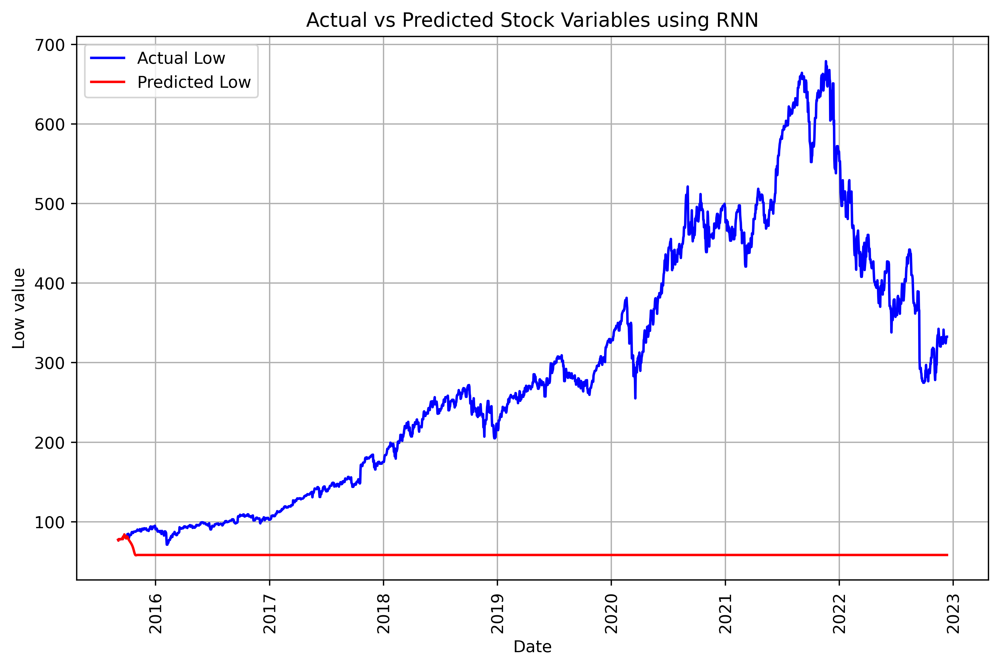

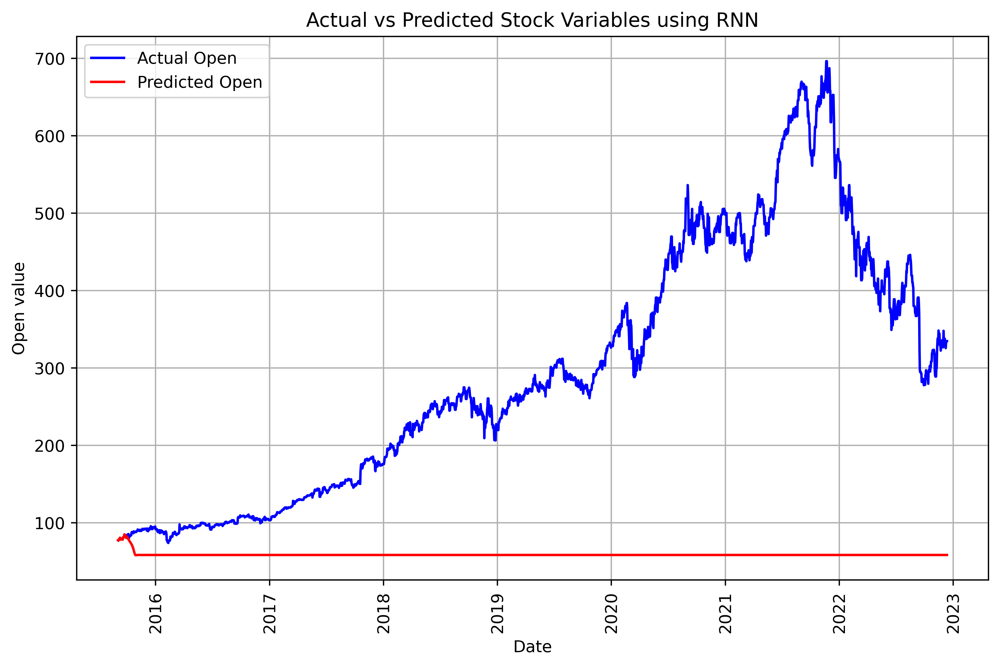

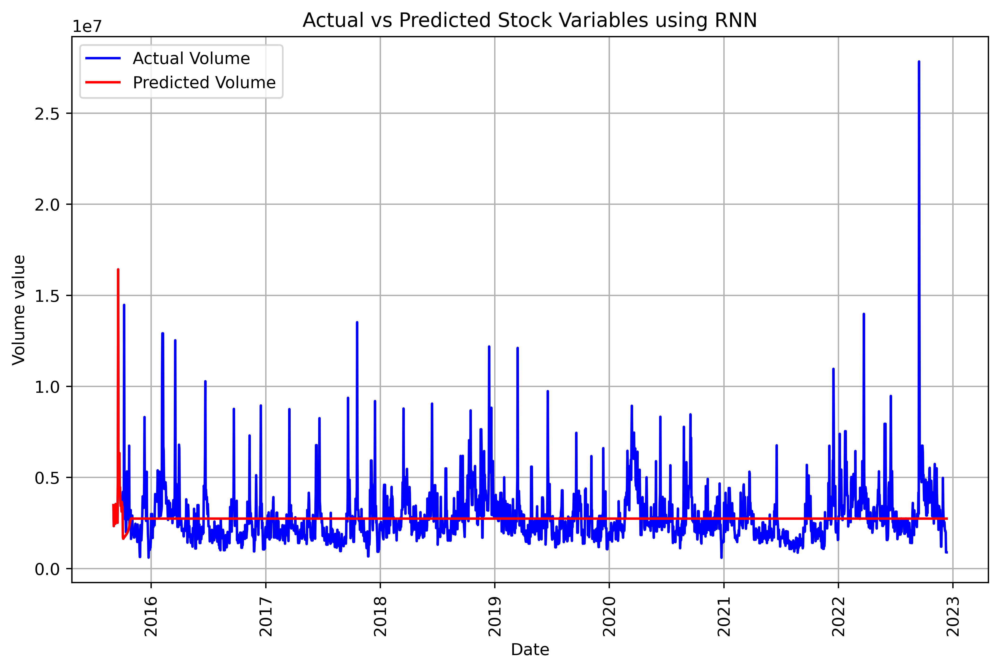

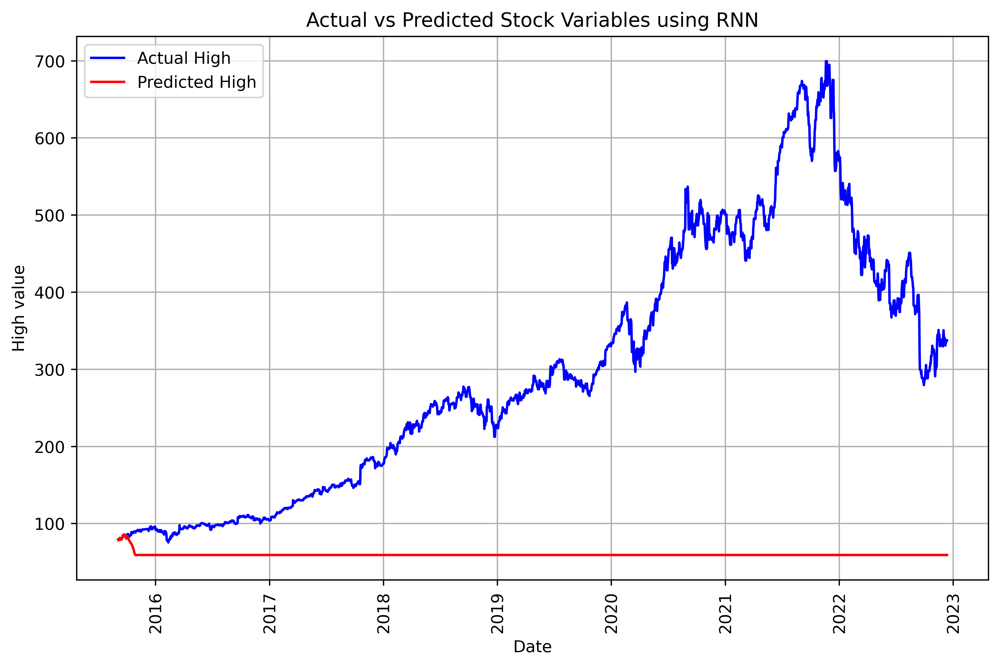

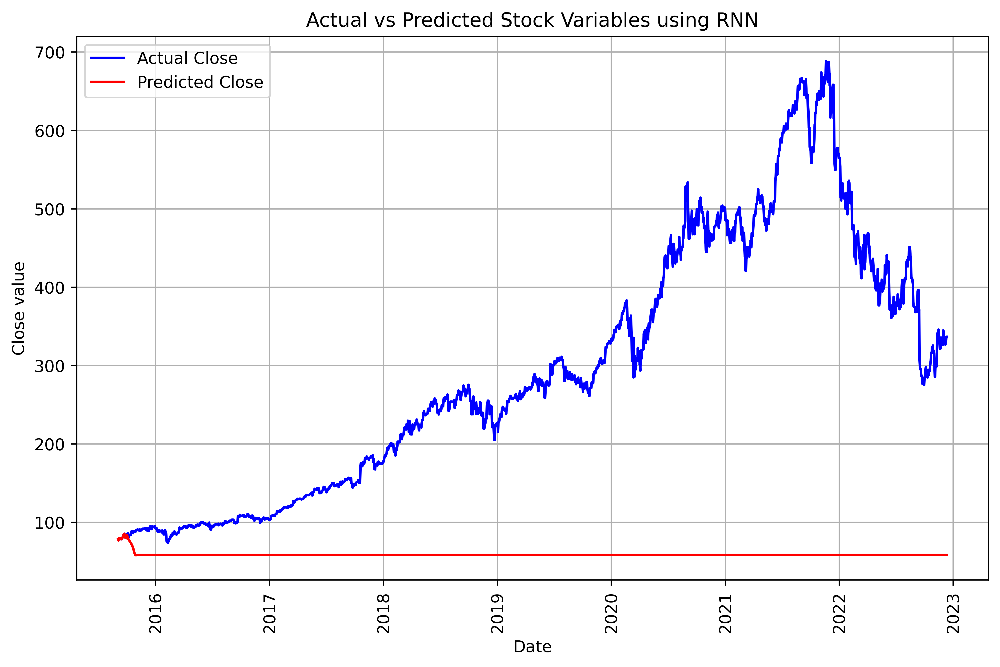

...

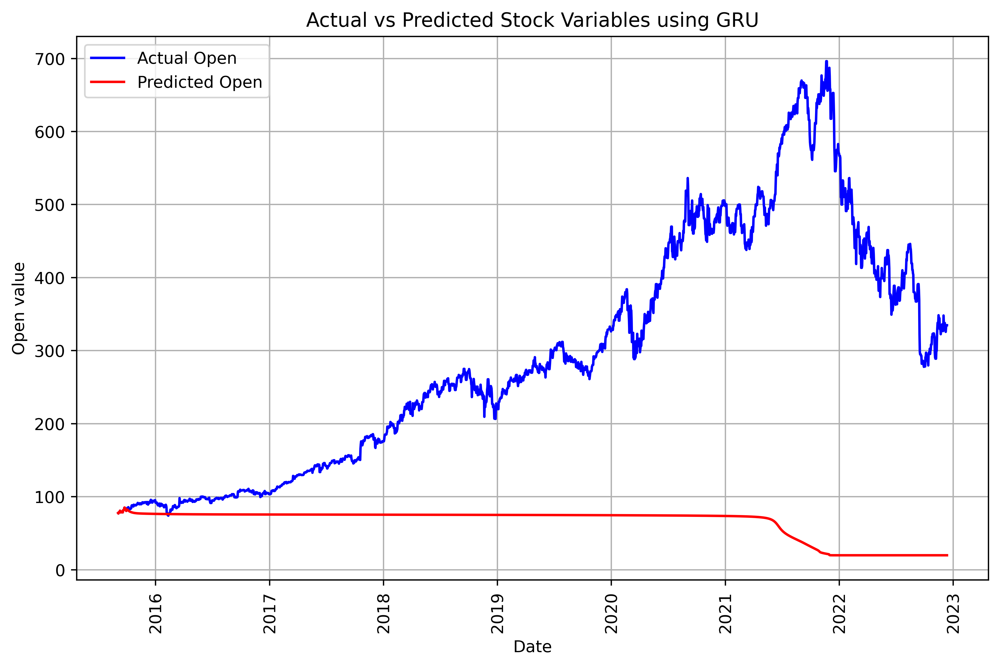

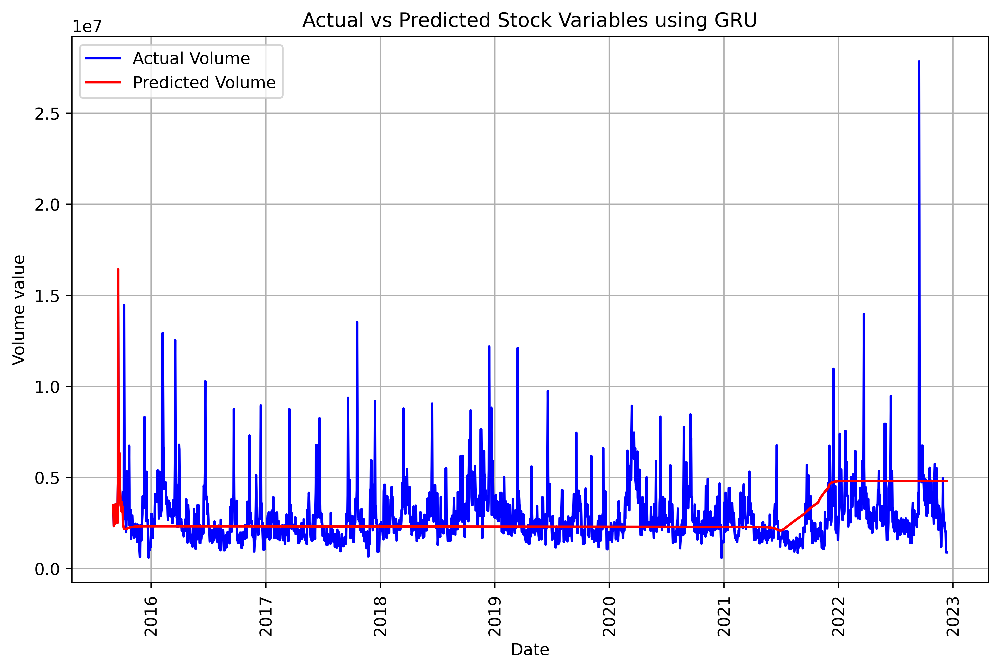

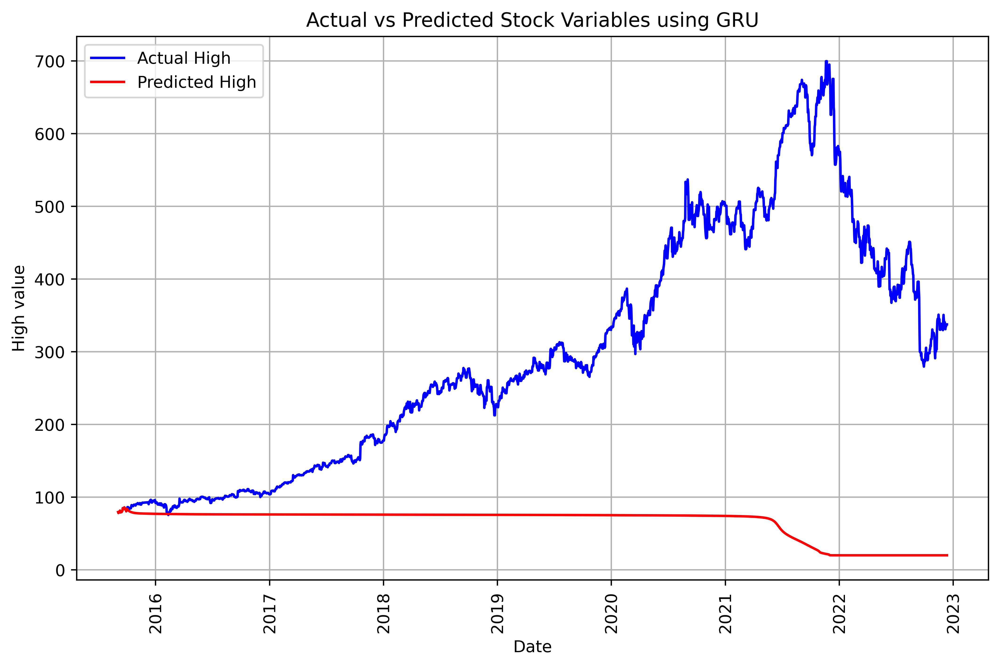

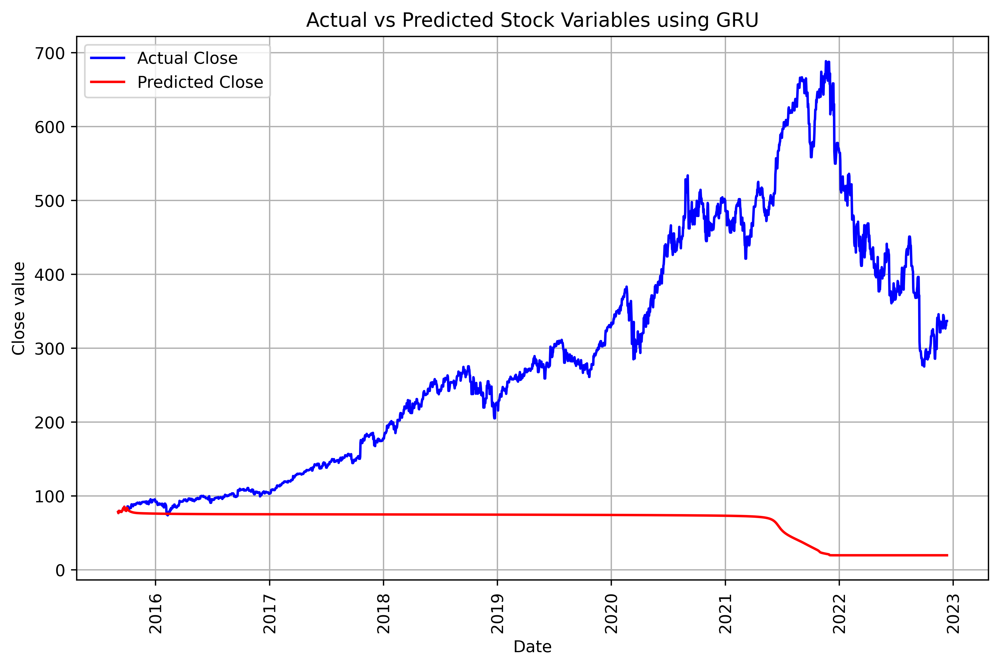

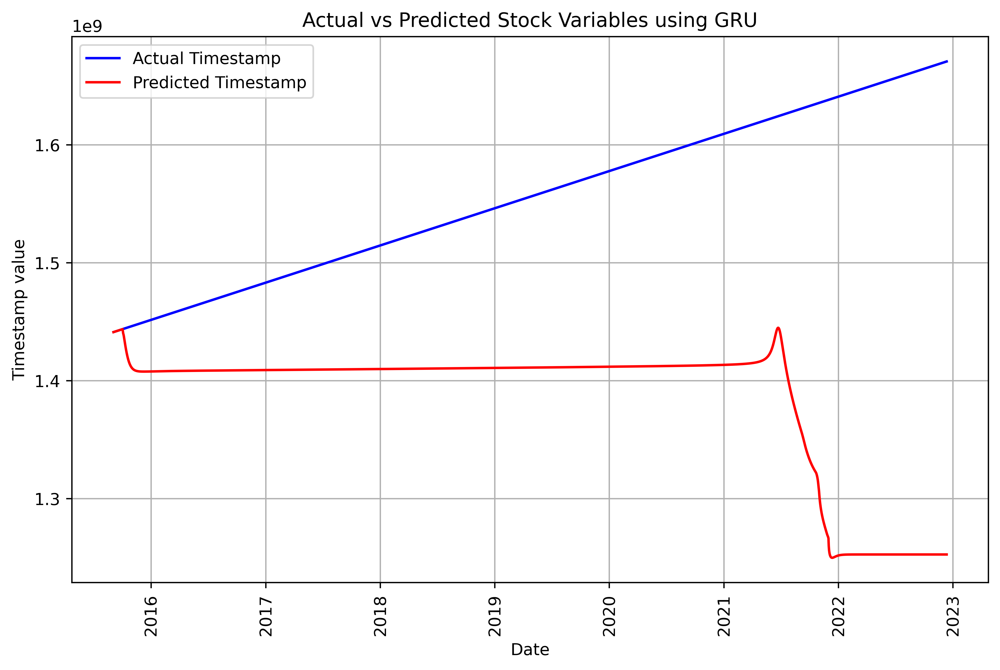

In [41]:
# Display the predicted vs actual graph over time.
for k, res in tuned_results_per_model.items():
    model = res['model']
    future_predictions = []
    initial_sequence =  list(test_sequences[0][:-1])[0].to_numpy() # Start with the initial sequence

    initial_sequence = torch.tensor(initial_sequence, dtype=torch.float32).unsqueeze(0)
    
    future_predictions = [list(x) for x in np.array(initial_sequence.clone()[0])]
    
    model.eval()
    current_sequence = initial_sequence.clone()  # Start with the initial sequence
    
    with torch.no_grad():
        for i in range(10, len(df_test['Date'])):  # Start predicting from the 10th data point
            next_value = model(current_sequence)  # Predict the next value
            future_predictions.append([x for x in np.array(next_value[0])])  # Append the prediction
    
            # Update the sequence by removing the first value and adding the predicted value
            next_value_scaled = next_value.numpy()  # Convert prediction to NumPy
            next_step = torch.tensor(next_value_scaled, dtype=torch.float32).unsqueeze(0).unsqueeze(2)  # Reshape to (1, 1, input_dim)
            current_sequence = torch.cat((current_sequence, next_step[0]), dim=1)  # Update sequence

    # Denormalize predictions
    future_predictions = np.array(future_predictions)  # Reshape for inverse_transform
    future_predictions_original = scaler.inverse_transform(future_predictions)
    
    # Get actual prices for comparison
    actual_values = df_test.drop('Date', axis=1).values  # Skip the first 10 data points
    actual_values_original = scaler.inverse_transform(actual_values)
    for i, column in enumerate(df_test.drop('Date', axis=1).columns):
        plt.figure(figsize=(10, 6))
        plt.plot(df_test['Date'], actual_values_original[:, i], label=f'Actual {column}', color='blue')
        plt.plot(df_test['Date'], future_predictions_original[:len(df_test['Date']), i], label=f'Predicted {column}', color='red')
        plt.xlabel('Date')
        plt.xticks(rotation=90)
        plt.grid(True)
        plt.ylabel(f'{column} value')
        plt.title(f'Actual vs Predicted Stock Variables using {model}')
        plt.legend()
        plt.show()

